# Trabajo práctico integrador. Análisis de datos.

## Descripción del problema

Evaluar diversas características de tumores de mama para predecir si el tumor es maligno o benigno.

### Import de librerías a utilizar

In [152]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as patches


from sklearn.svm import SVC
from sklearn.manifold import TSNE
from sklearn.datasets import load_breast_cancer
from ydata_profiling import ProfileReport
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.preprocessing import MinMaxScaler, Normalizer, RobustScaler, StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix, ConfusionMatrixDisplay, auc, roc_curve
from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import LogisticRegression
from mpl_toolkits.mplot3d import Axes3D
from sklearn.feature_selection import RFE
from ucimlrepo import fetch_ucirepo 
  


## 1. Obtención de datos

### Conjunto de datos

Diagnostic Wisconsin Breast Cancer Database.

https://archive.ics.uci.edu/dataset/17/breast+cancer+wisconsin+diagnostic

Créditos

William Wolberg | Olvi Mangasarian | Nick Street | W. Street
Creative Commons Attribution 4.0 International (CC BY 4.0) license.
https://creativecommons.org/licenses/by/4.0/legalcode

In [156]:
# fetch dataset 
breast_cancer_wisconsin_diagnostic = fetch_ucirepo(id=17) 

### Metadata

In [158]:
print(breast_cancer_wisconsin_diagnostic.metadata) 

{'uci_id': 17, 'name': 'Breast Cancer Wisconsin (Diagnostic)', 'repository_url': 'https://archive.ics.uci.edu/dataset/17/breast+cancer+wisconsin+diagnostic', 'data_url': 'https://archive.ics.uci.edu/static/public/17/data.csv', 'abstract': 'Diagnostic Wisconsin Breast Cancer Database.', 'area': 'Health and Medicine', 'tasks': ['Classification'], 'characteristics': ['Multivariate'], 'num_instances': 569, 'num_features': 30, 'feature_types': ['Real'], 'demographics': [], 'target_col': ['Diagnosis'], 'index_col': ['ID'], 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_of_dataset_creation': 1993, 'last_updated': 'Fri Nov 03 2023', 'dataset_doi': '10.24432/C5DW2B', 'creators': ['William Wolberg', 'Olvi Mangasarian', 'Nick Street', 'W. Street'], 'intro_paper': {'title': 'Nuclear feature extraction for breast tumor diagnosis', 'authors': 'W. Street, W. Wolberg, O. Mangasarian', 'published_in': 'Electronic imaging', 'year': 1993, 'url': 'https://www.semanticscholar.org/paper/53

### Variables

In [161]:
print(breast_cancer_wisconsin_diagnostic.variables) 


                  name     role         type demographic description units  \
0                   ID       ID  Categorical        None        None  None   
1            Diagnosis   Target  Categorical        None        None  None   
2              radius1  Feature   Continuous        None        None  None   
3             texture1  Feature   Continuous        None        None  None   
4           perimeter1  Feature   Continuous        None        None  None   
5                area1  Feature   Continuous        None        None  None   
6          smoothness1  Feature   Continuous        None        None  None   
7         compactness1  Feature   Continuous        None        None  None   
8           concavity1  Feature   Continuous        None        None  None   
9      concave_points1  Feature   Continuous        None        None  None   
10           symmetry1  Feature   Continuous        None        None  None   
11  fractal_dimension1  Feature   Continuous        None        

In [163]:
# Cargar el dataset desde sklearn.datasets 
data = load_breast_cancer()

# Convertirlo en dataframe para explorar los datos
df = pd.DataFrame(data.data, columns=data.feature_names)
df['target'] = data.target

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   mean radius              569 non-null    float64
 1   mean texture             569 non-null    float64
 2   mean perimeter           569 non-null    float64
 3   mean area                569 non-null    float64
 4   mean smoothness          569 non-null    float64
 5   mean compactness         569 non-null    float64
 6   mean concavity           569 non-null    float64
 7   mean concave points      569 non-null    float64
 8   mean symmetry            569 non-null    float64
 9   mean fractal dimension   569 non-null    float64
 10  radius error             569 non-null    float64
 11  texture error            569 non-null    float64
 12  perimeter error          569 non-null    float64
 13  area error               569 non-null    float64
 14  smoothness error         5

## 2. Preparación de datos

### Profile Report

In [167]:
"""
report = ProfileReport(
    df, title='Breast Cancer Wisconsin Report', explorative=True, lazy=False
)
report.to_notebook_iframe()
"""


"\nreport = ProfileReport(\n    df, title='Breast Cancer Wisconsin Report', explorative=True, lazy=False\n)\nreport.to_notebook_iframe()\n"

### Chequeo de duplicados

In [170]:
print (f'Observaciones duplicadas: {df.duplicated().sum()}')

Observaciones duplicadas: 0


### Separar entrenamiento y test

In [173]:
df.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0


In [175]:
X = df.drop('target', axis=1)
y = df['target']

In [177]:
X.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [179]:
y.head()

0    0
1    0
2    0
3    0
4    0
Name: target, dtype: int64

In [181]:
# 70-30
X_train, X_test, y_train, y_test = train_test_split(X,  y, test_size=0.3, random_state=42)

### Escalamiento de datos

In [184]:
# StandardScaler   -> promedio=0, desviacion estandar=1                       (cada feature)
# MinMaxScaler     -> escala valores de 0 a 1, (o rango pasado por parametro) (cada feature)
# RobustScaler     -> escala siendo robusto a outliers                        (cada feature)
# Normalizer       -> modifica los datos para que tengan norma=1              (cada fila) puede servir para calculos de ciertas distancias entre las isntancias como la distancia coseno

scalers = [
    StandardScaler(), 
    MinMaxScaler(),  
    RobustScaler(),  
    Normalizer(),  
]

In [186]:
# Dataset escalado
scaled_df = {}

for scaler in scalers:
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Transformar en DataFrames
    df_train_scaled = pd.DataFrame(X_train_scaled, columns=X.columns)
    df_test_scaled = pd.DataFrame(X_test_scaled, columns=X.columns)
    df_train_scaled['target'] = y_train.reset_index(drop=True)
    df_test_scaled['target'] = y_test.reset_index(drop=True)

    scaled_df[str(scaler)[:-2]] = [df_train_scaled, df_test_scaled]

    print(f"Datos de Entrenamiento Escalados con {scaler}:")
    print(df_train_scaled.head())
    
    print(f"\nDatos de Prueba Escalados con {scaler}:")
    print(df_test_scaled.head())


Datos de Entrenamiento Escalados con StandardScaler():
   mean radius  mean texture  mean perimeter  mean area  mean smoothness  \
0    -0.123490     -0.296801       -0.170507  -0.208616        -1.201680   
1    -0.228268     -0.657951       -0.253775  -0.296503        -1.804637   
2     0.145534     -1.230564        0.245833  -0.010242         0.519184   
3    -0.358532     -0.672207       -0.400937  -0.400014        -1.203862   
4    -0.157472      0.967224       -0.208843  -0.241538        -0.254695   

   mean compactness  mean concavity  mean concave points  mean symmetry  \
0         -0.773170       -0.762312            -0.933241      -1.229949   
1         -0.587616       -0.091985            -0.542684      -1.419985   
2          1.570006        0.732320             0.386583       1.054201   
3         -0.970650       -0.634704            -0.654992       0.096572   
4         -0.700630       -0.750349            -0.637469      -0.518248   

   mean fractal dimension  ...  worst

## 3. Exploración de datos

### Visualizar las primeras filas.

In [190]:
df.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0


### Realizar un resumen de 5 números.

In [193]:
# resumen estadístico de las columnas numéricas
df.describe()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,0.627417
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,0.483918
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,0.000000
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,0.000000
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,1.000000
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,1.000000
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,1.000000


In [195]:
for scaler_name, dfs in scaled_df.items():
    print(scaler_name)
    for d in dfs:
        description = df.describe()
        #print(description.T)

StandardScaler
MinMaxScaler
RobustScaler
Normalizer


### Identificar los tipos de datos

In [198]:
print(df.dtypes)

mean radius                float64
mean texture               float64
mean perimeter             float64
mean area                  float64
mean smoothness            float64
mean compactness           float64
mean concavity             float64
mean concave points        float64
mean symmetry              float64
mean fractal dimension     float64
radius error               float64
texture error              float64
perimeter error            float64
area error                 float64
smoothness error           float64
compactness error          float64
concavity error            float64
concave points error       float64
symmetry error             float64
fractal dimension error    float64
worst radius               float64
worst texture              float64
worst perimeter            float64
worst area                 float64
worst smoothness           float64
worst compactness          float64
worst concavity            float64
worst concave points       float64
worst symmetry      

El dataset tiene todas variables numéricas continuas porque corresponden a medidas del tumor.

Características relacionadas con valores promedio:

* mean radius: Radio medio de las células del tumor.
* mean texture: Textura media del tumor, que mide la variabilidad de la intensidad del píxel en la imagen del tumor.
* mean perimeter: Perímetro medio del tumor.
* mean area: Área media del tumor.
* mean smoothness: Suavidad media del contorno del tumor.
* mean compactness: Compactación media del tumor, que mide la relación entre el área y el perímetro.
* mean concavity: Concavidad media del tumor, que indica la severidad de las indentaciones en el contorno del tumor.
* mean concave points: Puntos concavos medios en el contorno del tumor.
* mean symmetry: Simetría media del tumor, que mide la simetría de la forma del tumor.
* mean fractal dimension: Dimensión fractal media del tumor, que mide la complejidad del contorno del tumor.

Características relacionadas con la desviación estándar (medidas de variabilidad):

* radius error: Error estándar del radio.
* texture error: Error estándar de la textura.
* perimeter error: Error estándar del perímetro.
* area error: Error estándar del área.
* smoothness error: Error estándar de la suavidad.
* compactness error: Error estándar de la compactación.
* concavity error: Error estándar de la concavidad.
* concave points error: Error estándar de los puntos concavos.
* symmetry error: Error estándar de la simetría.
* fractal dimension error: Error estándar de la dimensión fractal.

Medidas más extremas observadas para cada característica (peor valor):

* worst radius: Radio máximo observado del tumor.
* worst texture: Textura máxima observada del tumor.
* worst perimeter: Perímetro máximo observado del tumor.
* worst area: Área máxima observada del tumor.
* worst smoothness: Suavidad máxima observada del tumor.
* worst compactness: Compactación máxima observada del tumor.
* worst concavity: Concavidad máxima observada del tumor.
* worst concave points: Puntos concavos máximos observados en el tumor.
* worst symmetry: Simetría máxima observada del tumor.
* worst fractal dimension: Dimensión fractal máxima observada del tumor.

In [201]:
# Diccionario traducción de atributos
features_esn = {
    'mean radius' : 'Radio medio',              
    'mean texture' : 'Textura media',              
    'mean perimeter' : 'Perímetro medio',
    'mean area' : 'Área media',
    'mean smoothness' : 'Suavidad media',            
    'mean compactness' : 'Compactación media',
    'mean concavity' :  'Concavidad media',           
    'mean concave points' : 'Puntos cóncavos medios',
    'mean symmetry' : 'Simetría media',            
    'mean fractal dimension' : 'Dimensión fractal media',    
    'radius error' : 'Error estándar del radio',              
    'texture error' : 'Error estándar de la textura',             
    'perimeter error' : 'Error estándar del perímetro',            
    'area error' : 'Error estándar del área',                 
    'smoothness error' : 'Error estándar de la suavidad',           
    'compactness error' : 'Error estándar de la compatación',          
    'concavity error' : 'Error estándar de la concavidad',           
    'concave points error' : 'Error estándar de los puntos cóncavos',      
    'symmetry error' : 'Error estándar de la simetría',            
    'fractal dimension error' : 'Error estándar de la dimensión fractal',  
    'worst radius' : 'Peor radio',              
    'worst texture' : 'Peor textura',             
    'worst perimeter' : 'Peor perímetro',
    'worst area' : 'Peor área',
    'worst smoothness' : 'Peor suavidad',          
    'worst compactness' : 'Peor compactación',         
    'worst concavity' : 'Peor concavidad',      
    'worst concave points' : 'Peor número de puntos cóncavos',      
    'worst symmetry' : 'Peor simetría',            
    'worst fractal dimension' : 'Peor dimensión fractal'
}

In [203]:
print(df['target'].unique())

[0 1]


El target se compone de una variable categórica numérica entera.
Clasificación binaria (0-1)

In [206]:
# Nombres de las clases
target_names = data.target_names

# Codificación de la clase
target_values = set(data.target)

# Crear un diccionario para mapear valores a nombres de clases
target_description = {i: name for i, name in enumerate(target_names)}

print(target_description)


{0: 'malignant', 1: 'benign'}


0 - Representa un tumor maligno.

1 - Representa tumor benigno.

In [209]:
target_esn = {
    0: 'Maligno',
    1: 'Benigno'
}

### Distribución de los datos

In [212]:
# Columnas numéricas
num_columns = df.select_dtypes(include=['float64']).columns


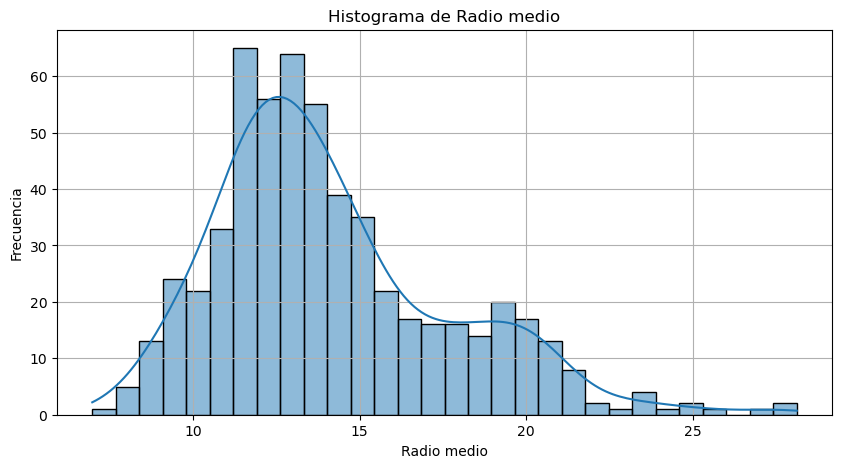

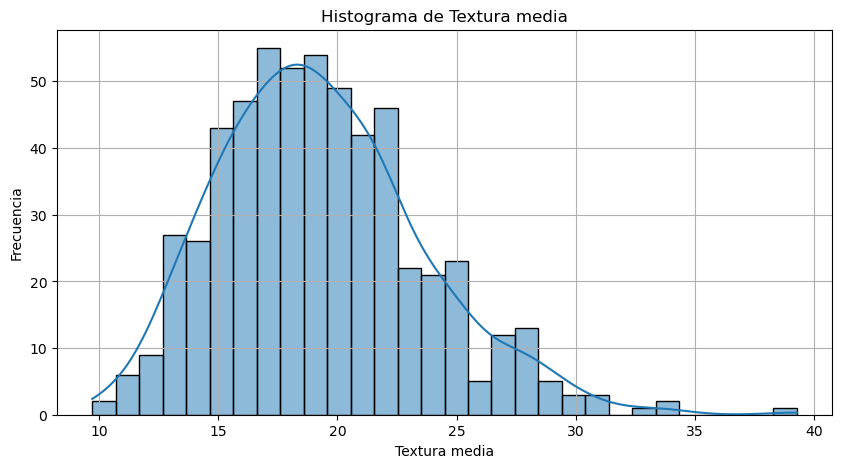

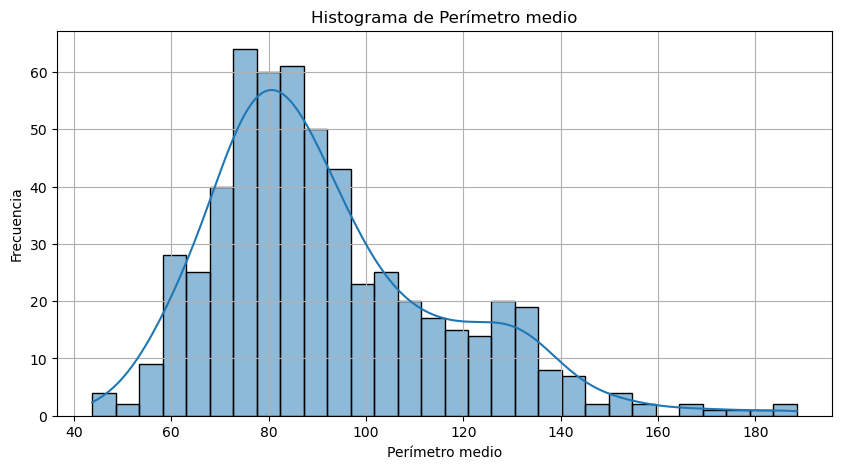

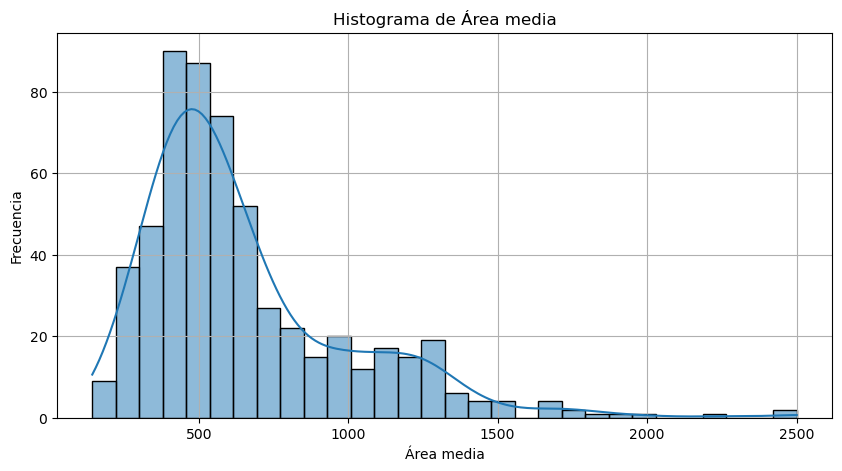

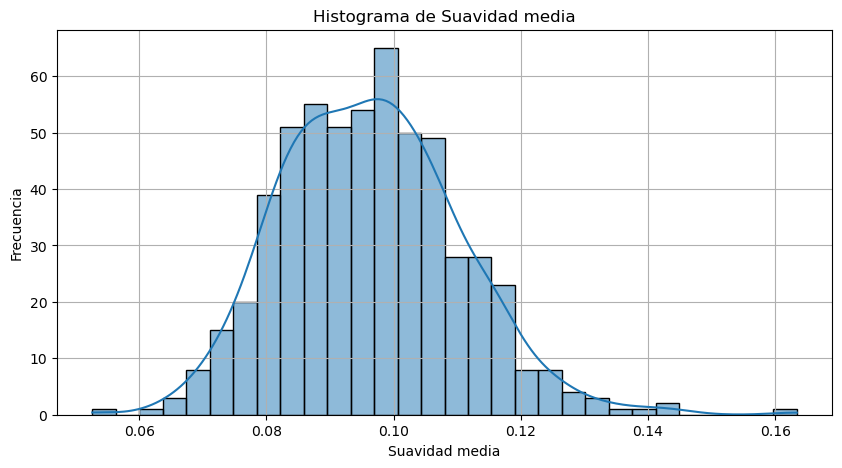

...

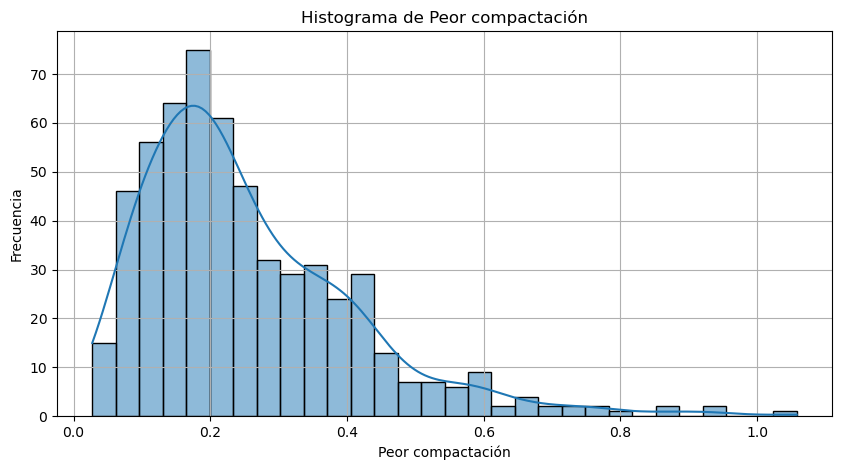

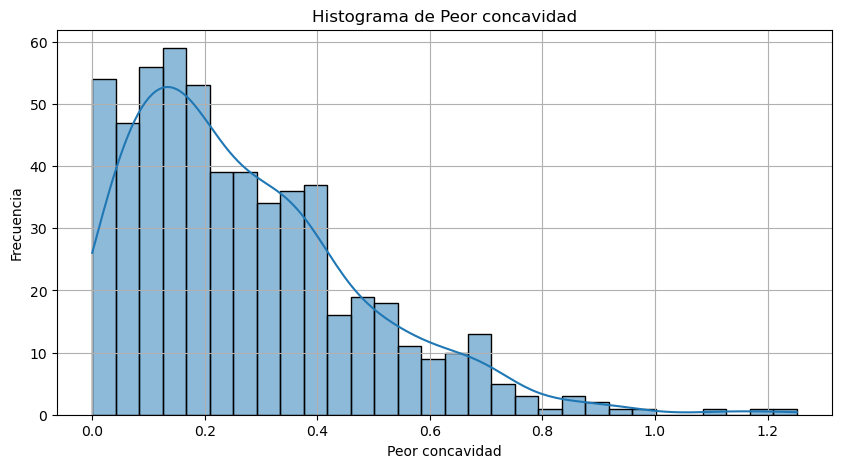

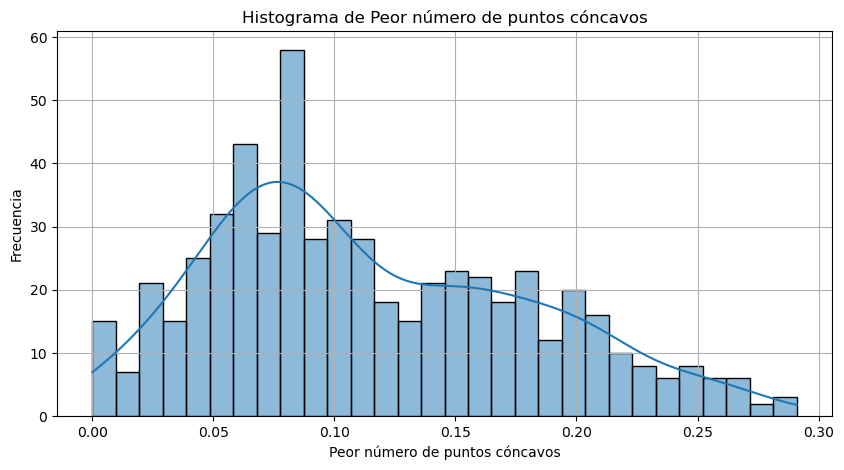

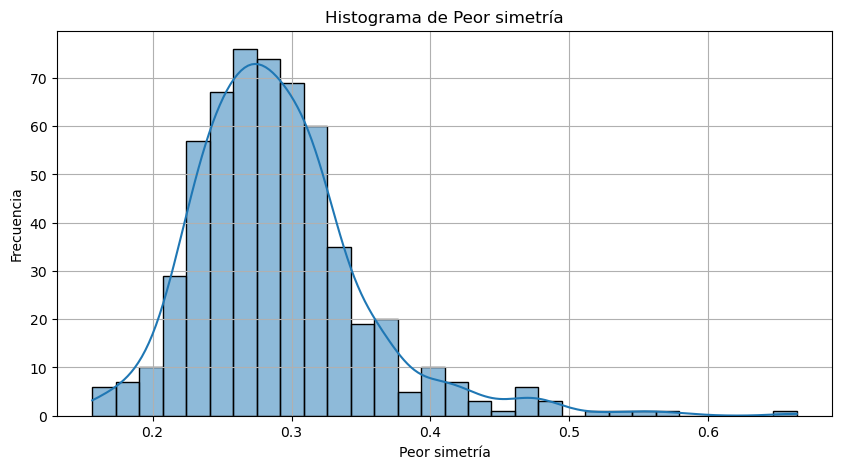

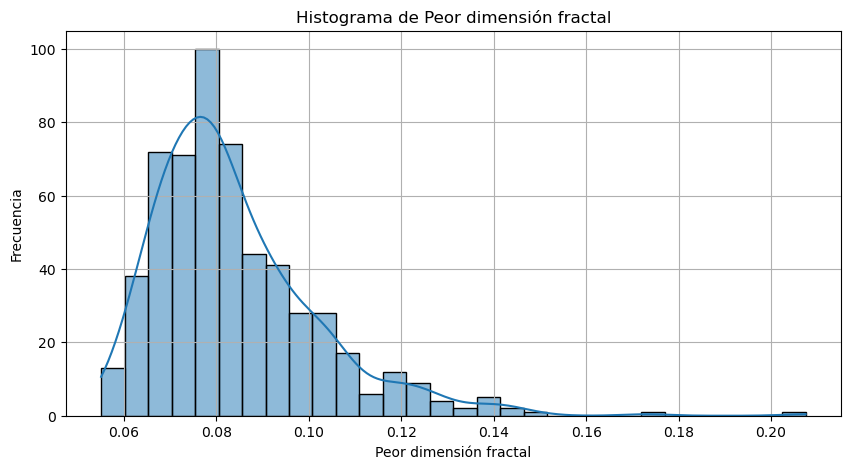

In [214]:
# Crear histograma para cada variable
for feature in num_columns:
    plt.figure(figsize=(10, 5))
    sns.histplot(df[feature], bins=30, kde=True)
    plt.title(f'Histograma de {features_esn[feature]}')
    plt.xlabel(features_esn[feature])
    plt.ylabel('Frecuencia')
    plt.grid(True)
    plt.show()

In [215]:
palette = {
    0: '#ff9999',  # Rojo
    1: '#99ff99'   # Verde
}

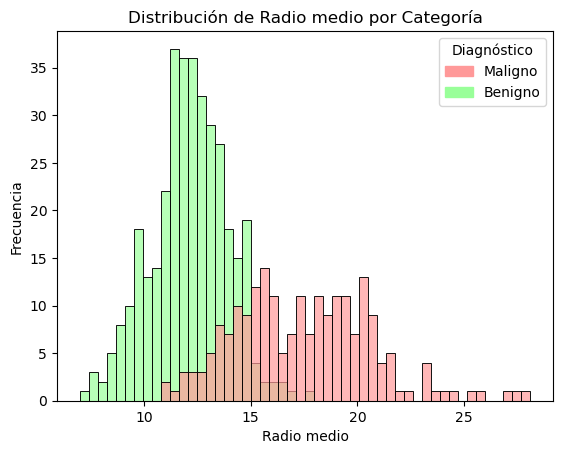

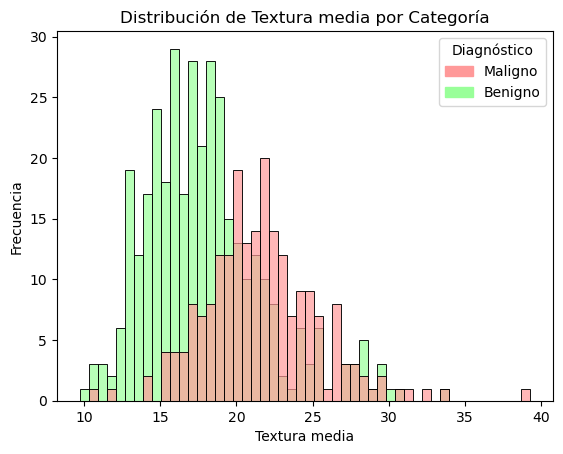

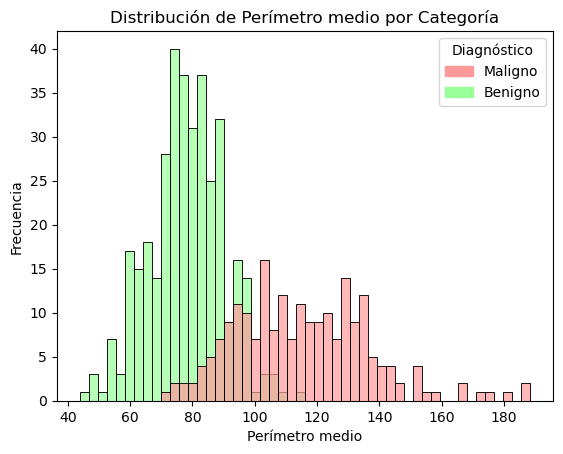

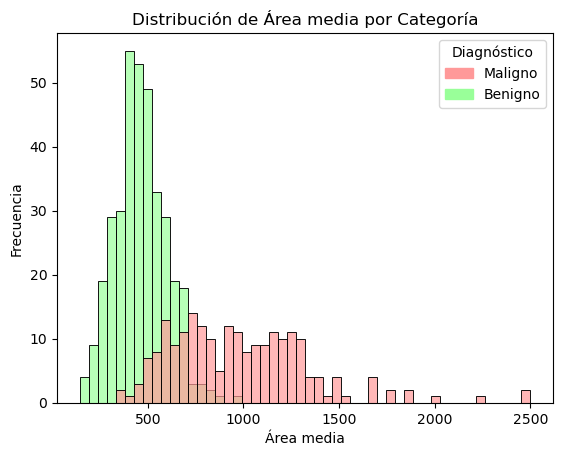

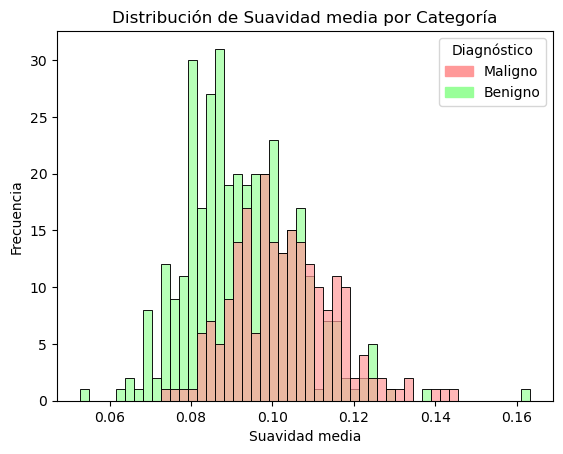

...

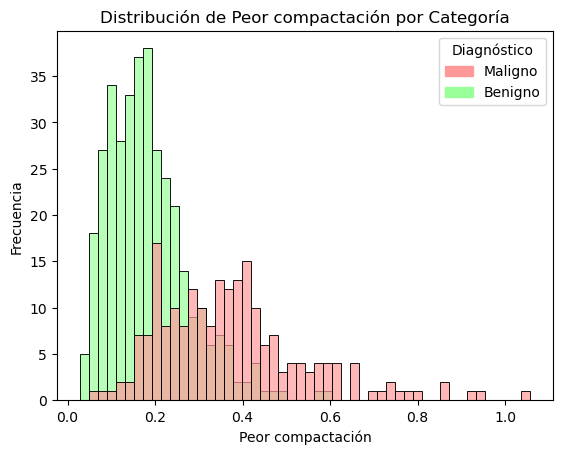

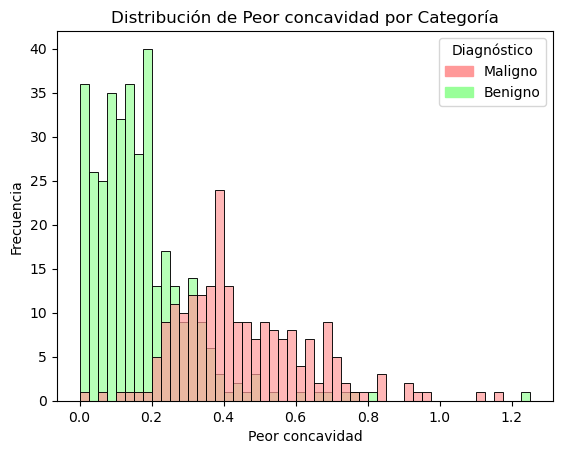

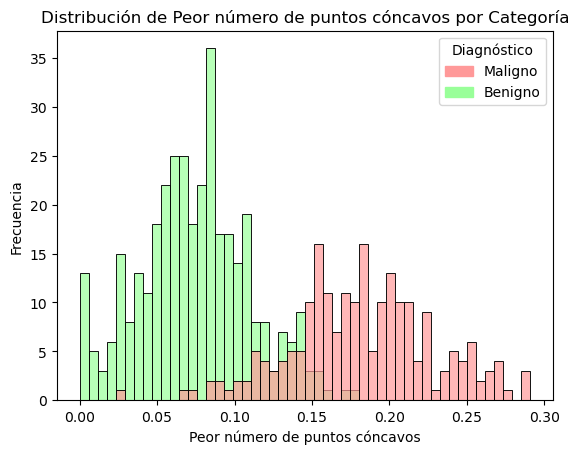

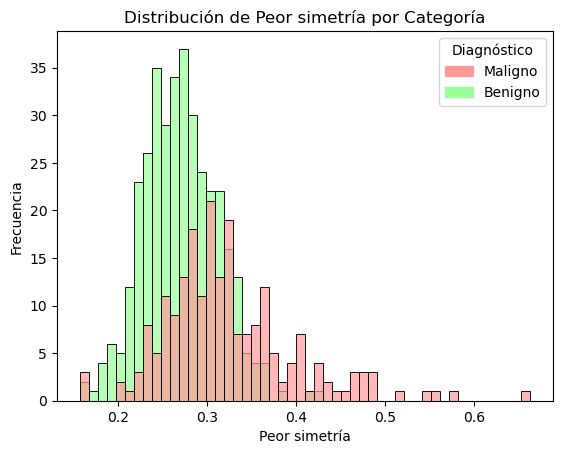

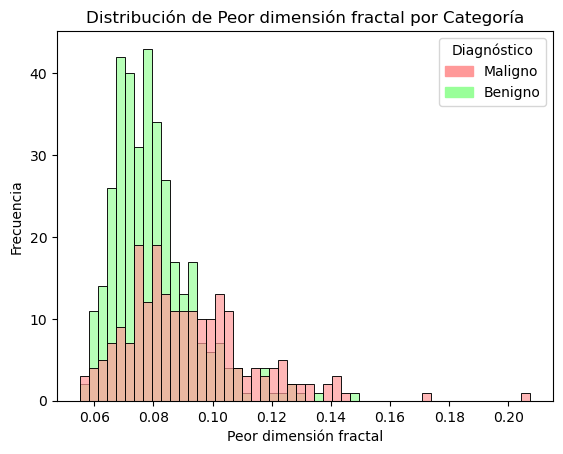

In [216]:
# Crear histogramas para cada variable según target
for feature in num_columns:
    sns.histplot(data=df, x=feature, hue='target', bins=50, alpha=0.7, palette=palette)
    plt.xlabel(features_esn[feature])
    plt.ylabel('Frecuencia')
    plt.title(f'Distribución de {features_esn[feature]} por Categoría')

    handles = [patches.Patch(color=palette[0], label='Maligno'), patches.Patch(color=palette[1], label='Benigno')]
    plt.legend(handles=handles, title='Diagnóstico')
    
    plt.show()


### Distribución de categorías

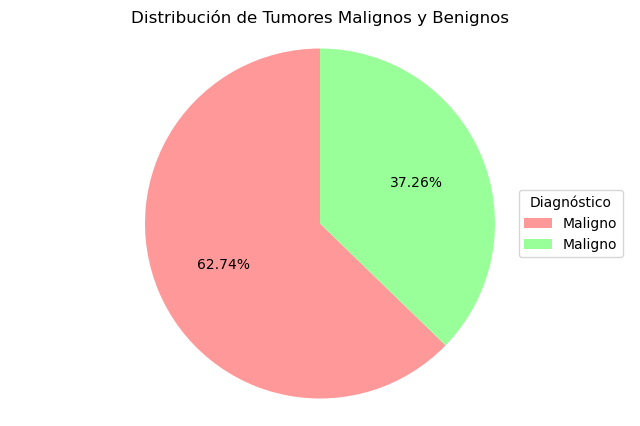

In [220]:
class_counts = df['target'].value_counts()

labels_id = data.target
labels = [target_esn[label] for label in labels_id]

plt.figure(figsize=(8, 5))
plt.pie(class_counts, autopct='%1.2f%%', colors=['#ff9999', '#99ff99'], startangle=90)
plt.title('Distribución de Tumores Malignos y Benignos')
plt.axis('equal')  # Igualar el aspecto del gráfico para que sea un círculo

plt.legend(labels=labels, title='Diagnóstico', loc='right')

plt.show()


### Correlación entre atributos

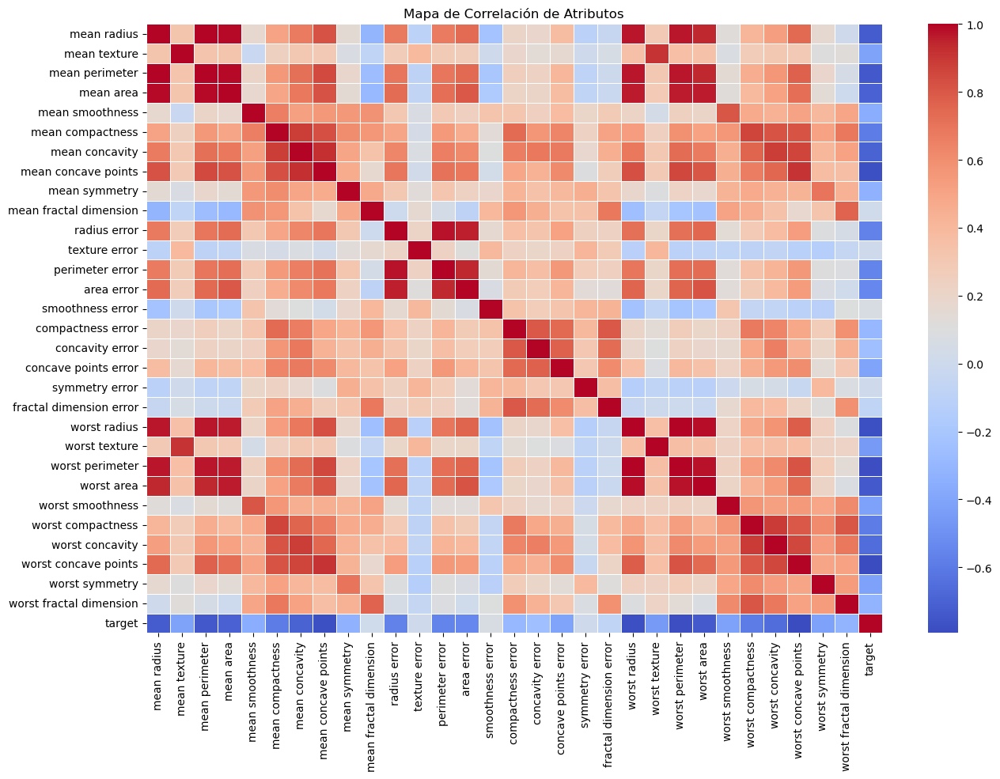

In [230]:
plt.figure(figsize=(15, 10))
correlation = df.corr()
sns.heatmap(correlation, annot=False, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Mapa de Correlación de Atributos')
plt.show()




In [232]:
# Correlación de cada atributo con el target
correlation_with_target = correlation['target'].sort_values(ascending=False)
print(correlation_with_target)


target                     1.000000
smoothness error           0.067016
mean fractal dimension     0.012838
texture error              0.008303
symmetry error             0.006522
fractal dimension error   -0.077972
concavity error           -0.253730
compactness error         -0.292999
worst fractal dimension   -0.323872
mean symmetry             -0.330499
mean smoothness           -0.358560
concave points error      -0.408042
mean texture              -0.415185
worst symmetry            -0.416294
worst smoothness          -0.421465
worst texture             -0.456903
area error                -0.548236
perimeter error           -0.556141
radius error              -0.567134
worst compactness         -0.590998
mean compactness          -0.596534
worst concavity           -0.659610
mean concavity            -0.696360
mean area                 -0.708984
mean radius               -0.730029
worst area                -0.733825
mean perimeter            -0.742636
worst radius              -0

In [234]:
# Umbral asumido => Máxima correlación entre atributos
threshold = 0.7

# Pares de atributos con correlación alta (> 0.7 o < -0.7)
high_correlation_pairs = (correlation.abs() > 0.7) & (correlation != 1.0)
high_correlation_attrs = correlation[high_correlation_pairs]

pairs = set()
for i in high_correlation_attrs.index:
    for j in high_correlation_attrs.columns:
        if pd.notna(high_correlation_attrs.loc[i, j]):
            index = tuple(sorted([i, j]))
            pairs.add((*index, high_correlation_attrs.loc[i, j]))

for k in pairs:
    print(f"{k[0]} - {k[1]} : {k[2]}")

mean concave points - mean radius : 0.8225285223871786
target - worst radius : -0.77645377859504
mean concave points - worst concavity : 0.7523994975749643
compactness error - mean compactness : 0.7387217896603929
mean concave points - worst area : 0.809629619909618
area error - mean area : 0.8000859212343201
worst compactness - worst concave points : 0.8010803646352528
perimeter error - worst perimeter : 0.7210313099890175
mean area - mean radius : 0.9873571700566127
worst compactness - worst concavity : 0.8922608987764685
target - worst area : -0.7338250349210507
worst concave points - worst perimeter : 0.8163221016875439
mean area - worst perimeter : 0.9591195743552645
mean concave points - target : -0.7766138400204369
mean concave points - worst concave points : 0.9101553142985918
mean radius - worst area : 0.9410824595860461
compactness error - fractal dimension error : 0.8032688176617679
mean radius - target : -0.7300285113754563
area error - radius error : 0.951830112110991
mean

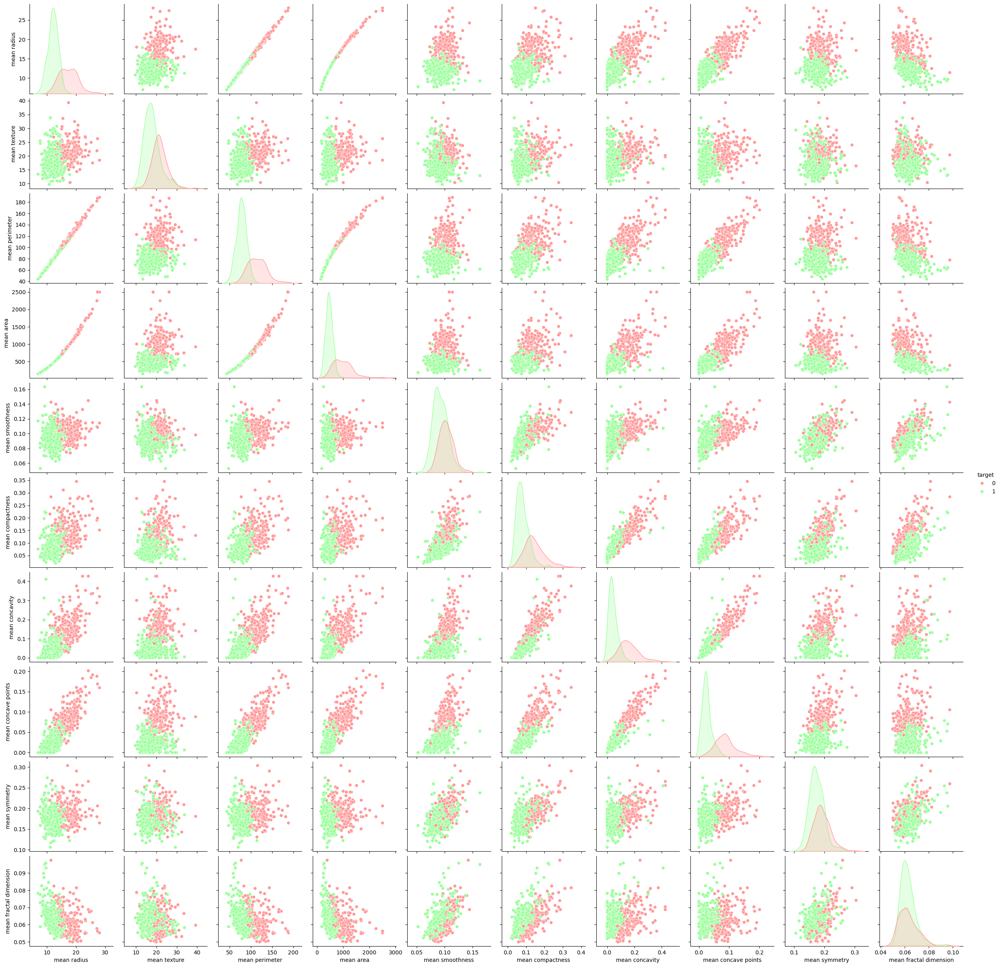

In [236]:
df_mean = df.filter(regex='mean|target')
sns.pairplot(data=df_mean, diag_kind="kde", hue='target', palette=palette);

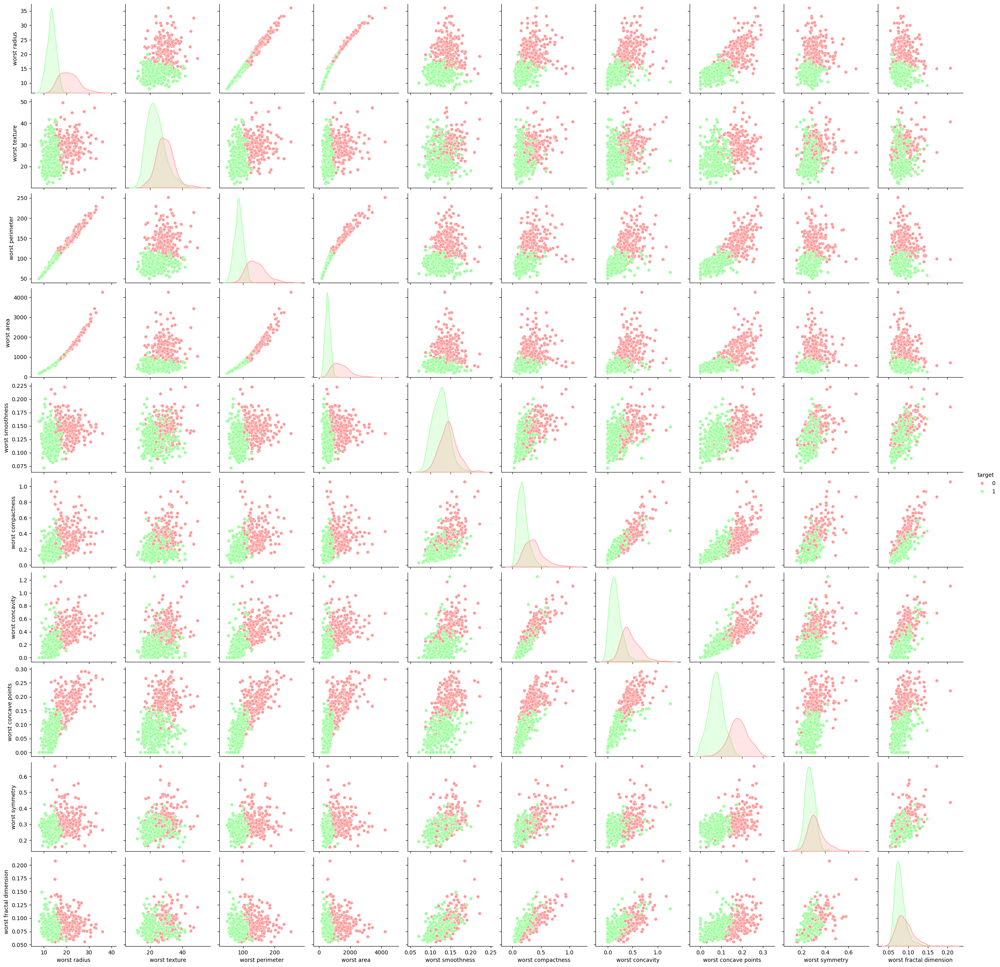

In [237]:
df_worst = df.filter(regex='worst|target')
sns.pairplot(data=df_worst, diag_kind="kde", hue='target', palette=palette);

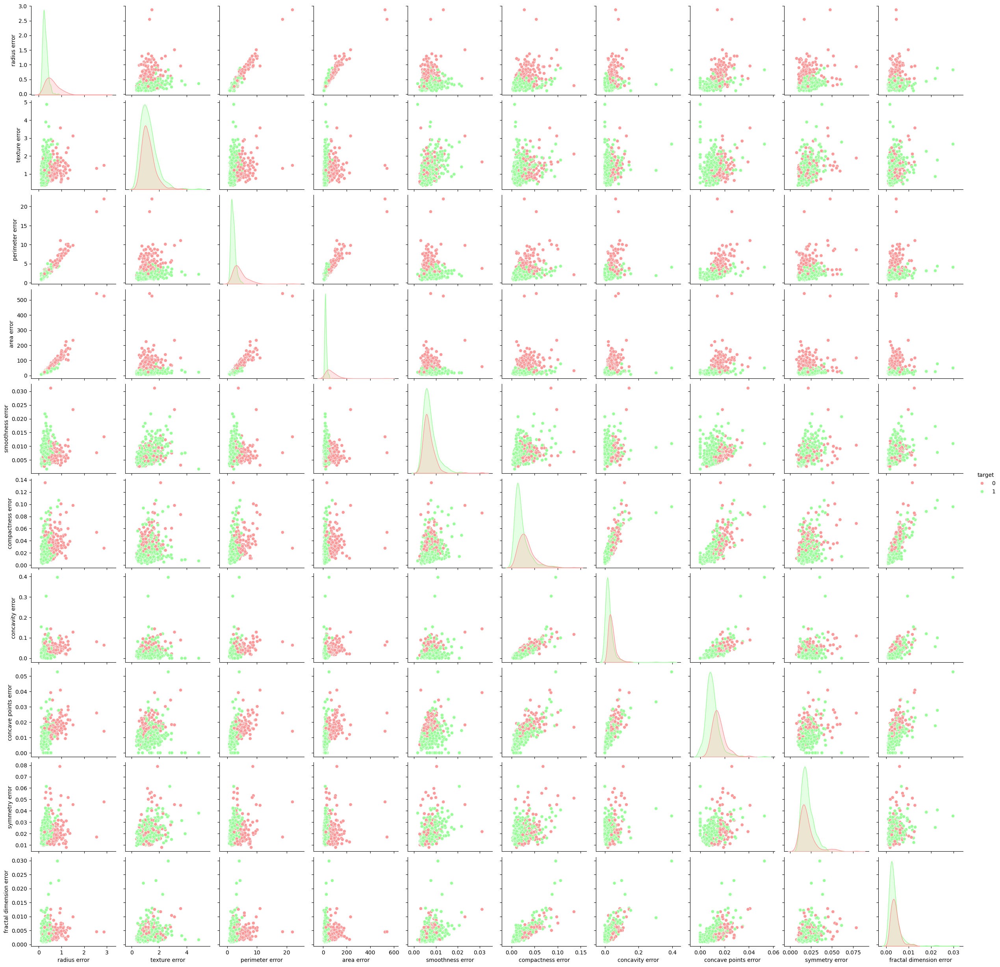

In [239]:
df_error = df.filter(regex='error|target')
sns.pairplot(data=df_error, diag_kind="kde", hue='target', palette=palette);

### Box plots

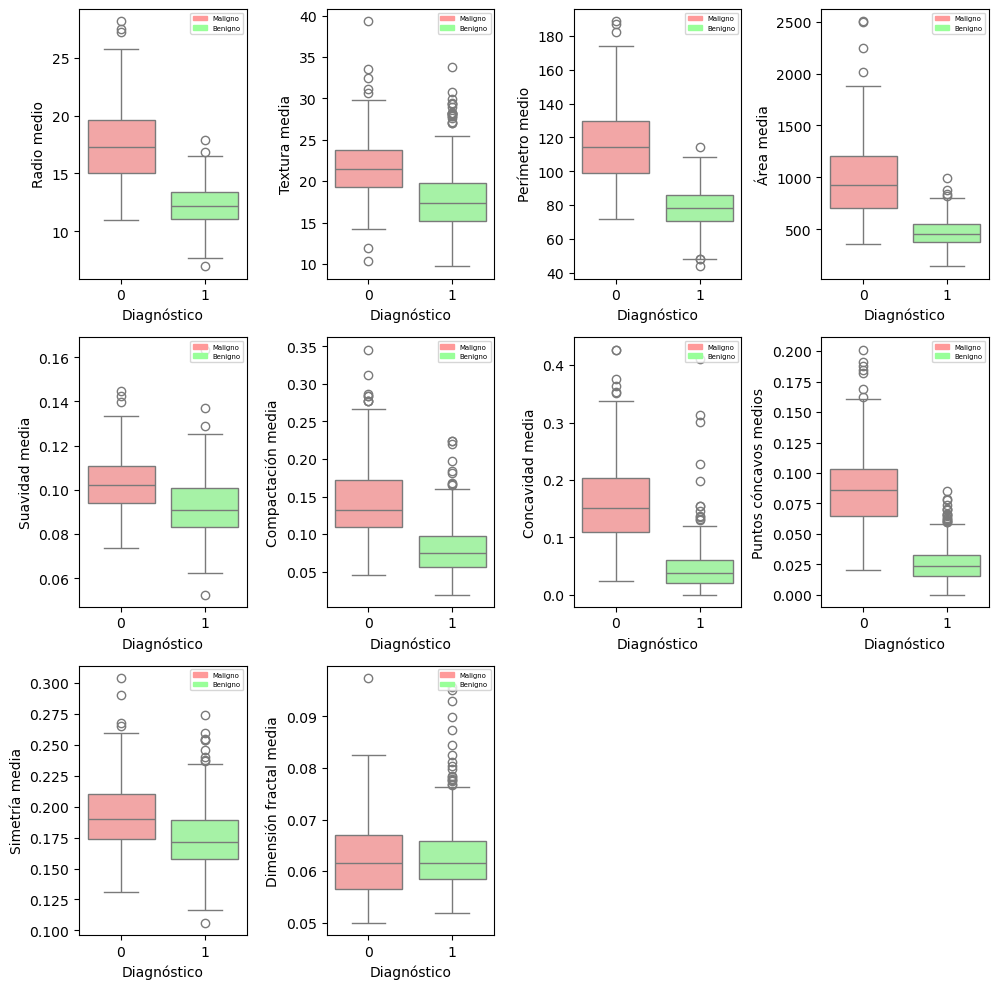

In [245]:
plt.figure(figsize=(10, 10))

for i, feature in enumerate(df_mean.drop(columns='target')):
    plt.subplot(10 // 4 + 1, 4, i + 1)  
    sns.boxplot(data=df, x='target', y=feature, palette=palette, hue='target')
    plt.xlabel('Diagnóstico')
    plt.ylabel(features_esn[feature])
    handles = [patches.Patch(color=palette[0], label='Maligno'), patches.Patch(color=palette[1], label='Benigno')]
    plt.legend(handles=handles, fontsize='5', loc='upper right')

plt.tight_layout()
plt.show()


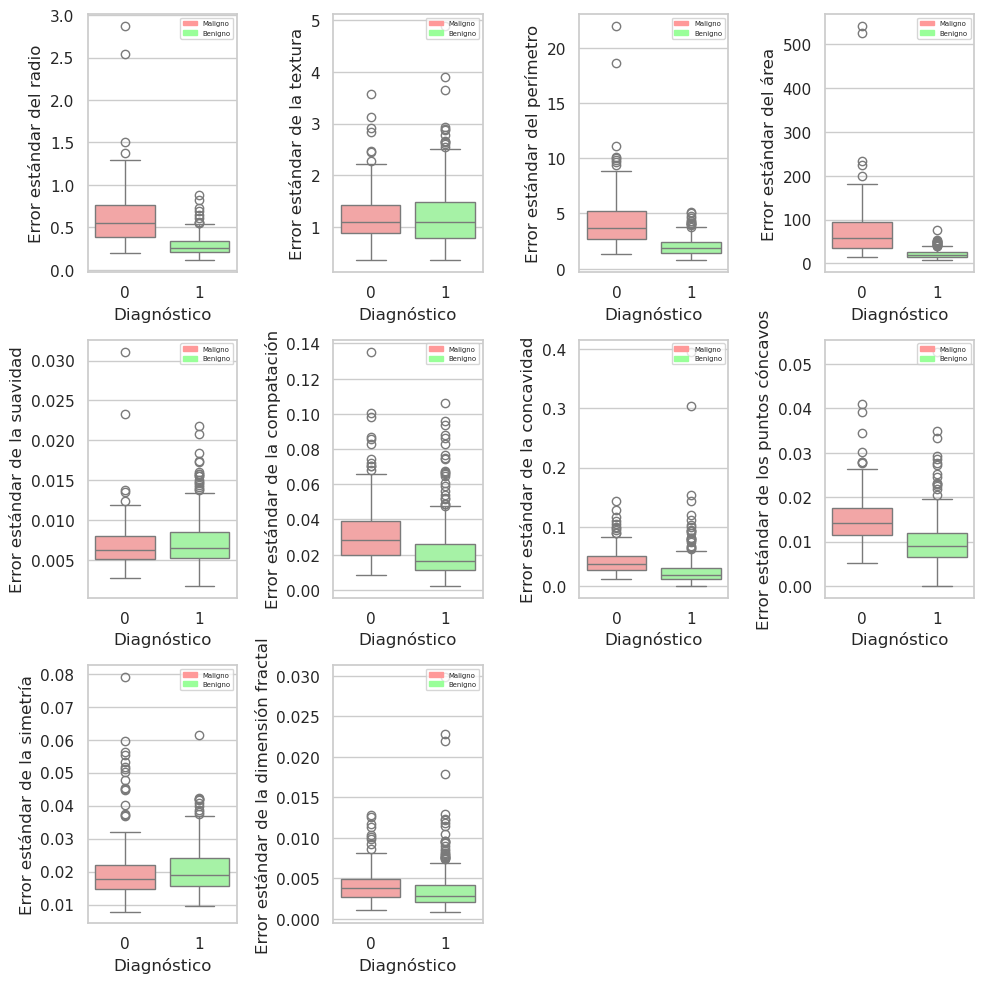

In [1219]:
plt.figure(figsize=(10, 10))

for i, feature in enumerate(df_error.drop(columns='target')):
    plt.subplot(len(mean_features) // 4 + 1, 4, i + 1)  
    sns.boxplot(data=df, x='target', y=feature, palette=palette, hue='target')
    plt.xlabel('Diagnóstico')
    plt.ylabel(features_esn[feature])
    handles = [patches.Patch(color=palette[0], label='Maligno'), patches.Patch(color=palette[1], label='Benigno')]
    plt.legend(handles=handles, fontsize='5', loc='upper right')

plt.tight_layout()
plt.show()

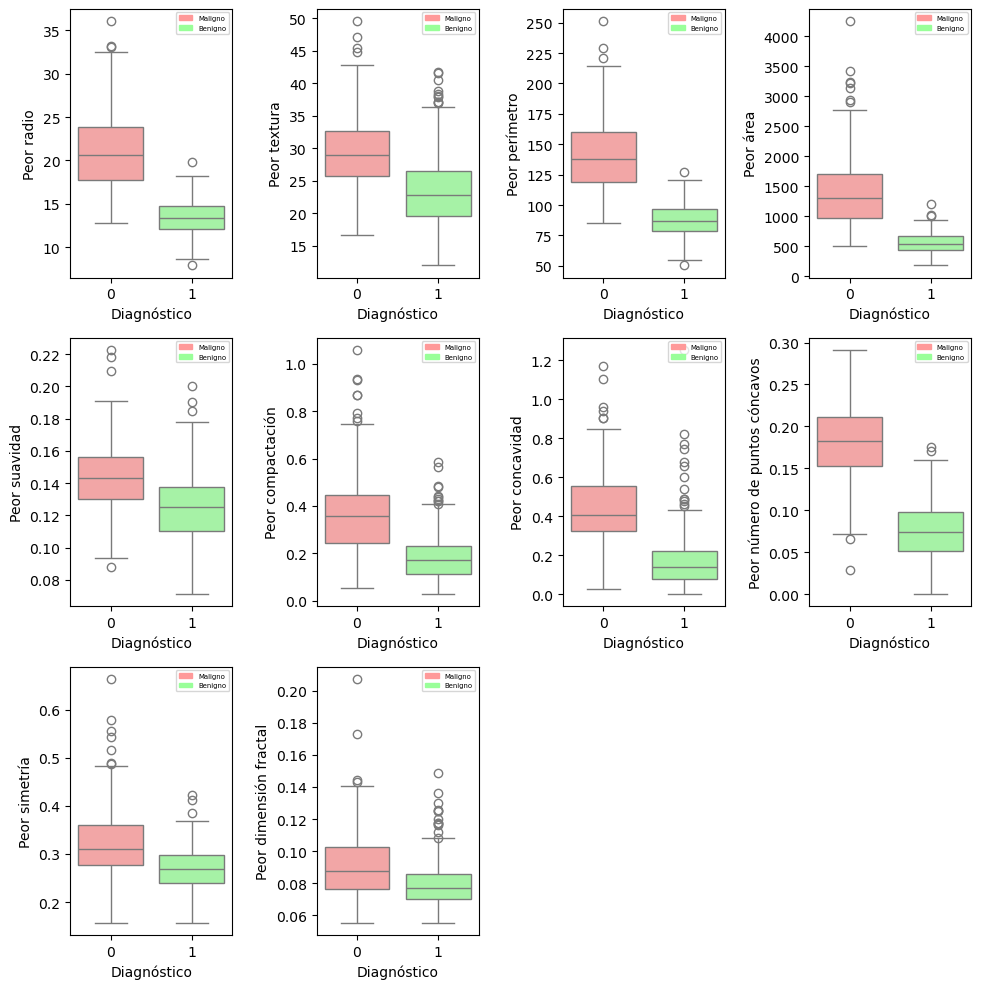

In [247]:
plt.figure(figsize=(10, 10))

for i, feature in enumerate(df_worst.drop(columns='target')):
    plt.subplot(10 // 4 + 1, 4, i + 1)  
    sns.boxplot(data=df, x='target', y=feature, palette=palette, hue='target')
    plt.xlabel('Diagnóstico')
    plt.ylabel(features_esn[feature])
    handles = [patches.Patch(color=palette[0], label='Maligno'), patches.Patch(color=palette[1], label='Benigno')]
    plt.legend(handles=handles, fontsize='5', loc='upper right')

plt.tight_layout()
plt.show()

### Bubble plots

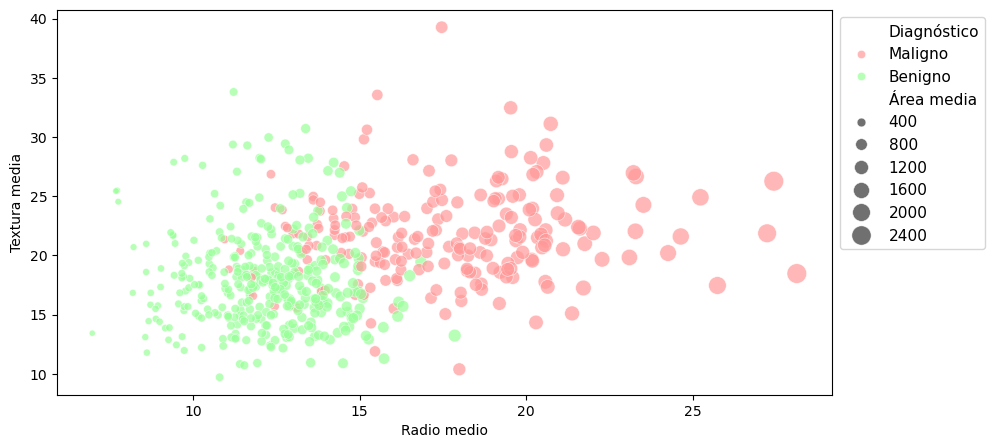

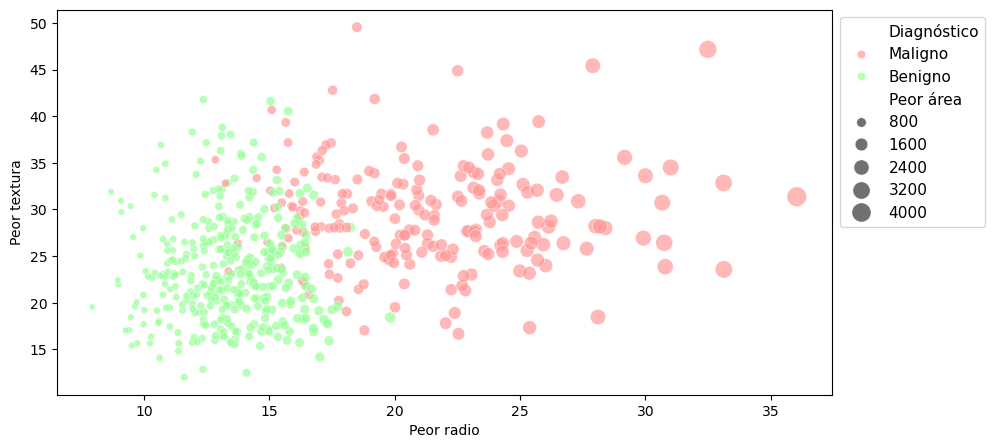

In [250]:
# Características para comparar en el bubble plot
# x_feature, y_feature, size_feature

bubble_plot = [
    ['mean radius', 'mean texture', 'mean area'],
    ['worst radius', 'worst texture', 'worst area']
]

for i in bubble_plot:
    x_feature = i[0]
    y_feature = i[1]
    size_feature = i[2]

    plt.figure(figsize=(10, 5))
    bubble_plot = sns.scatterplot(
        data=df,
        x=x_feature,
        y=y_feature,
        size=size_feature,
        hue='target',
        palette=palette,
        sizes=(20, 200),  # Ajusta el rango de tamaños de burbujas
        alpha=0.7
    )
    
    plt.xlabel(features_esn[x_feature])
    plt.ylabel(features_esn[y_feature])

    handles, labels = bubble_plot.get_legend_handles_labels()
    for i, label in enumerate(labels):
        if label == 'target':
            labels[i] = 'Diagnóstico'
        elif label in features_esn:
            labels[i] = features_esn[label]
        elif int(label) in target_esn:
            labels[i] = target_esn[int(label)]
        else:
            labels[i] = label

    bubble_plot.legend(
        handles=handles,
        labels=labels,
        loc='upper left',
        bbox_to_anchor=(1, 1),
        title_fontsize='13',
        fontsize='11'
    )

    plt.show()


### Histograma 2D

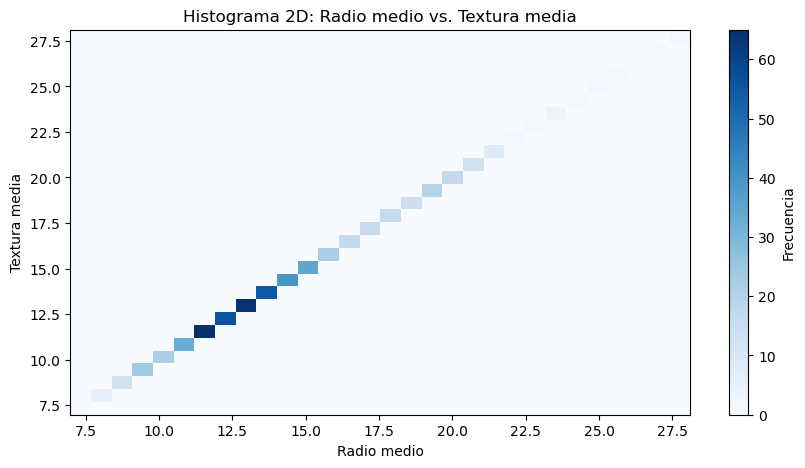

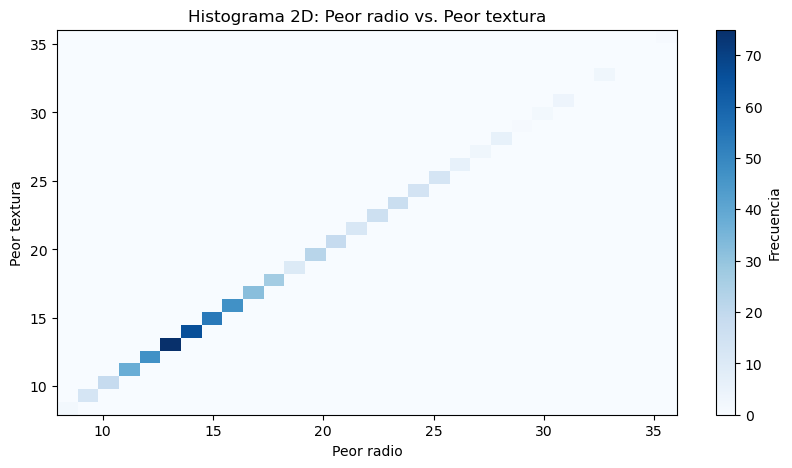

In [253]:
# Características para comparar en el bubble plot
# x_feature, y_feature, size_feature

hist_2D = [
    ['mean radius', 'mean texture'],
    ['worst radius', 'worst texture']
]


for i in hist_2D:
    plt.figure(figsize=(10, 5))
    plt.hist2d(df[i[0]], df[i[0]], bins=30, cmap='Blues')
    plt.colorbar(label='Frecuencia')
    plt.xlabel(features_esn[i[0]])
    plt.ylabel(features_esn[i[1]])
    plt.title(f'Histograma 2D: {features_esn[i[0]]} vs. {features_esn[i[1]]}')
    plt.show()


### Joint Plot

Combina un gráfico de dispersión con histogramas marginales para facilitar la visualización de la relación entre dos variables continuas.

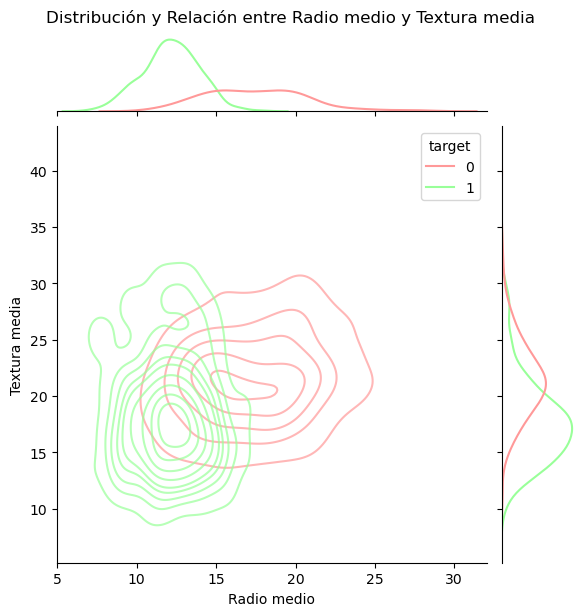

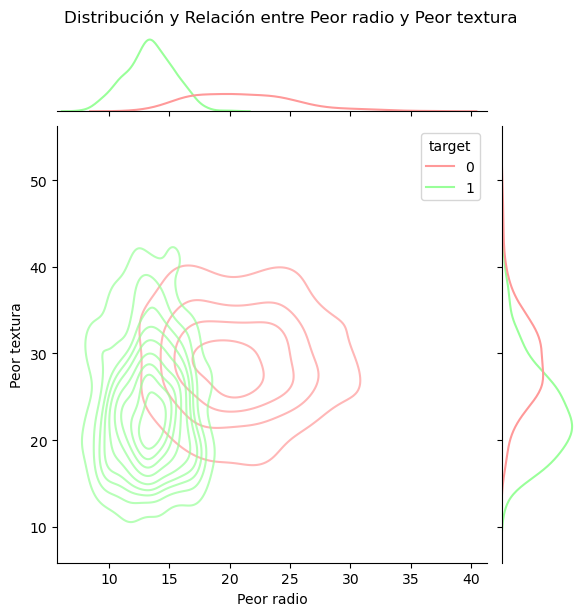

In [257]:
j_plot = [
    ['mean radius', 'mean texture'],
    ['worst radius', 'worst texture']
]

for i in j_plot:
    sns.jointplot(data=df, x=df[i[0]], y=df[i[1]], hue='target', palette=palette, alpha=0.7, kind='kde')
    plt.suptitle(f'Distribución y Relación entre {features_esn[i[0]]} y {features_esn[i[1]]}', y=1.02)
    plt.xlabel(features_esn[i[0]])
    plt.ylabel(features_esn[i[1]])
    plt.show()


### Selección de características

In [260]:
# Entrenar el modelo Decision Tree
model = DecisionTreeClassifier(random_state=42)
model.fit(X_train, y_train)

DecisionTreeClassifier(random_state=42)

In [262]:
# Predecir y evaluar el modelo con todas las características
y_pred_all_features = model.predict(X_test)
accuracy_all_features = accuracy_score(y_test, y_pred_all_features)
print(f'Precisión con todas las características: {accuracy_all_features:.2f}')

Precisión con todas las características: 0.94


In [264]:
# Obtener la importancia de las características
importances = model.feature_importances_
feature_importance_df = pd.DataFrame({
    'Feature': X.columns, 
    'Importance': importances}).sort_values(by='Importance', ascending=False)

# Mostrar la importancia de las características
print("Importancia de las características:")
print(feature_importance_df)


Importancia de las características:
                    Feature  Importance
7       mean concave points    0.705839
21            worst texture    0.114062
20             worst radius    0.070187
23               worst area    0.036653
1              mean texture    0.022885
17     concave points error    0.017164
13               area error    0.013563
24         worst smoothness    0.010492
16          concavity error    0.007152
14         smoothness error    0.002004
19  fractal dimension error    0.000000
0               mean radius    0.000000
18           symmetry error    0.000000
25        worst compactness    0.000000
26          worst concavity    0.000000
27     worst concave points    0.000000
28           worst symmetry    0.000000
22          worst perimeter    0.000000
15        compactness error    0.000000
12          perimeter error    0.000000
11            texture error    0.000000
10             radius error    0.000000
9    mean fractal dimension    0.000000
8   

In [266]:
# Seleccionar las características más importantes
selector = SelectFromModel(model, prefit=True, threshold=0.01)
X_train_selected = selector.transform(X_train)
X_test_selected = selector.transform(X_test)

# Mostrar las características seleccionadas
selected_features = X.columns[selector.get_support()]
print("Características seleccionadas:")
print(selected_features)

Características seleccionadas:
Index(['mean texture', 'mean concave points', 'area error',
       'concave points error', 'worst radius', 'worst texture', 'worst area',
       'worst smoothness'],
      dtype='object')


/home/myrna/anaconda3/envs/CEIA/lib/python3.11/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/home/myrna/anaconda3/envs/CEIA/lib/python3.11/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


In [268]:
# Entrenar el modelo Decision Tree con las características seleccionadas
model_selected = DecisionTreeClassifier(random_state=42)
model_selected.fit(X_train_selected, y_train)

# Predecir y evaluar el modelo con las características seleccionadas
y_pred_selected_features = model_selected.predict(X_test_selected)
accuracy_selected_features = accuracy_score(y_test, y_pred_selected_features)
print(f'Precisión con las características seleccionadas: {accuracy_selected_features:.2f}')

Precisión con las características seleccionadas: 0.95


In [270]:
print("Características seleccionadas:\n")
for item in selected_features:
    print(features_esn[item])

Características seleccionadas:

Textura media
Puntos cóncavos medios
Error estándar del área
Error estándar de los puntos cóncavos
Peor radio
Peor textura
Peor área
Peor suavidad


## 4. Desarrollo de modelos

### Regresión Logística

In [274]:
def LogRegression (X_tr, y_tr, X_ts, y_ts):
    lregression = LogisticRegression(random_state = 42, class_weight="balanced")
    lregression.fit(X_tr, y_tr)

    y_pred_lr = lregression.predict(X_ts)

    ## Matriz de confusión
    cm_lr = confusion_matrix(y_ts, y_pred_lr)
    
    g_cm_lr = ConfusionMatrixDisplay(confusion_matrix=cm_lr, display_labels=lregression.classes_)
    
    fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(15, 5), gridspec_kw={'width_ratios': [1, 1]})
    
    ax0.axvline(x=0.5, color='gray', linestyle='--')
    ax0.axhline(y=0.5, color='gray', linestyle='--')
    ax0.text(0.25, 0.75, 'VERDADEROS\nNEGATIVOS', fontsize=12, ha='center', va='center')
    ax0.text(0.75, 0.75, 'FALSOS\nPOSITIVOS', fontsize=12, ha='center', va='center')
    ax0.text(0.25, 0.25, 'FALSOS\nNEGATIVOS', fontsize=12, ha='center', va='center')
    ax0.text(0.75, 0.25, 'VERDADEROS\nPOSITIVOS', fontsize=12, ha='center', va='center')
    ax0.set_xlim(0, 1)
    ax0.set_ylim(0, 1)
    ax0.axis('off')
    
    g_cm_lr.plot(ax=ax1, cmap='Greens')
    ax1.set_title("REGRESIÓN LOGÍSTICA")
    ax1.set_xlabel('Predicción') 
    ax1.set_ylabel('Valor verdadero') 
    
    plt.tight_layout()
    plt.show()

    metrics_data = [
    [f"{round(accuracy_score(y_ts, y_pred_lr)*100, 2)}%"],
    [round(precision_score(y_ts, y_pred_lr, zero_division=0), 4)],    
    [round(recall_score(y_ts, y_pred_lr, zero_division=0), 4)]
    ]
    
    metrics = pd.DataFrame(metrics_data, 
                           columns=['REGRESION LOGISTICA'], 
                           index=['Accuracy', 'Precision', 'Recall'])
    
    display(metrics)

    y_probs_lr = lregression.predict_proba(X_ts)[:, -1]

    fp_lr, p_lr, thresholds_lr = roc_curve(y_ts, y_probs_lr)
    
    plt.figure(figsize=(5, 5))
    plt.plot(fp_lr, p_lr, color='green', label="Regresión Logística")
    plt.plot([0, 1], [0, 1], color='red', linestyle='--')
    plt.xlabel("Tasa de Falsos Positivos")
    plt.ylabel("Tasa de Verdaderos Positivos")
    plt.title('Curva ROC')
    plt.legend()
    plt.grid(True)
    plt.show()

    auc_lr = auc(fp_lr, p_lr)
    print(f"AUC Regresión Logística = {auc_lr}")
    # El área bajo la curva de ser cercana a 1

Dataset con datos sin escalar:


/home/myrna/anaconda3/envs/CEIA/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


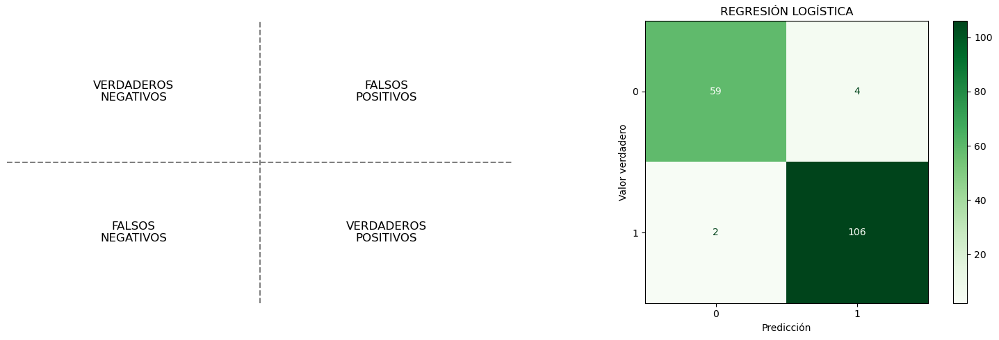

,REGRESION LOGISTICA
Accuracy,96.49%
Precision,0.9636
Recall,0.9815


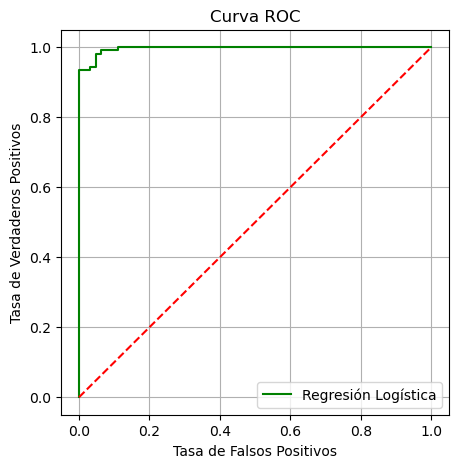

AUC Regresión Logística = 0.9963256907701352


In [276]:
print ("Dataset con datos sin escalar:")
LogRegression (X_train, y_train, X_test, y_test)


Datos escalados con StandardScaler


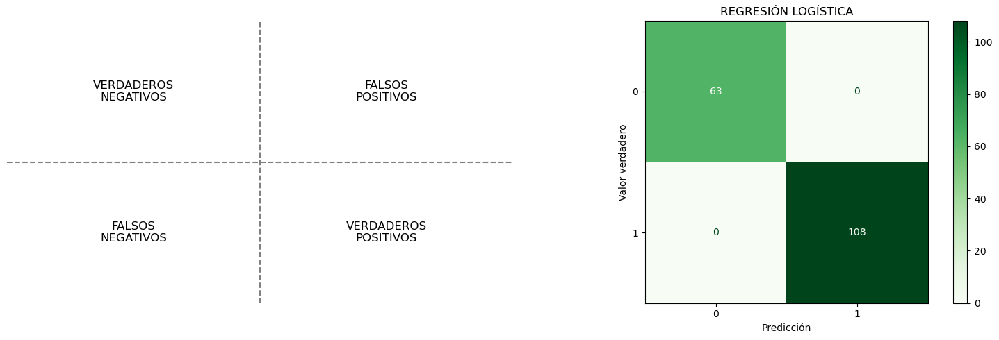

,REGRESION LOGISTICA
Accuracy,100.0%
Precision,1.0
Recall,1.0


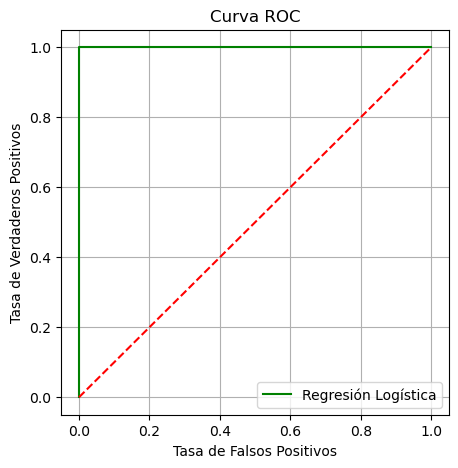

AUC Regresión Logística = 1.0

Datos escalados con MinMaxScaler


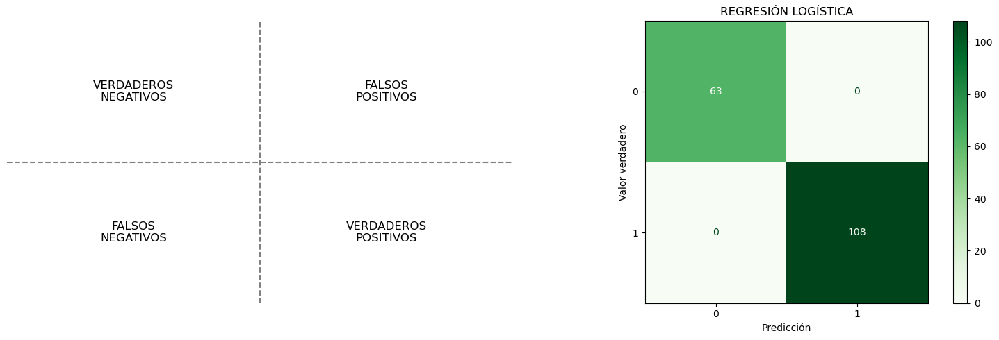

,REGRESION LOGISTICA
Accuracy,100.0%
Precision,1.0
Recall,1.0


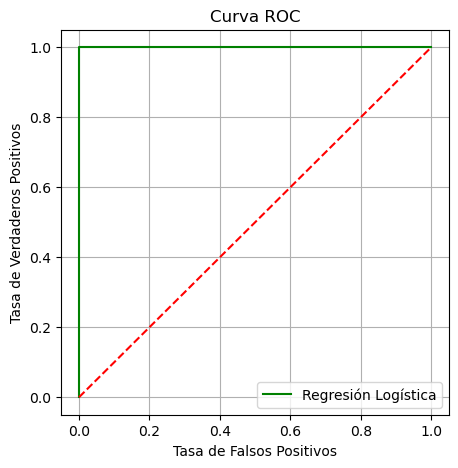

AUC Regresión Logística = 1.0

Datos escalados con RobustScaler


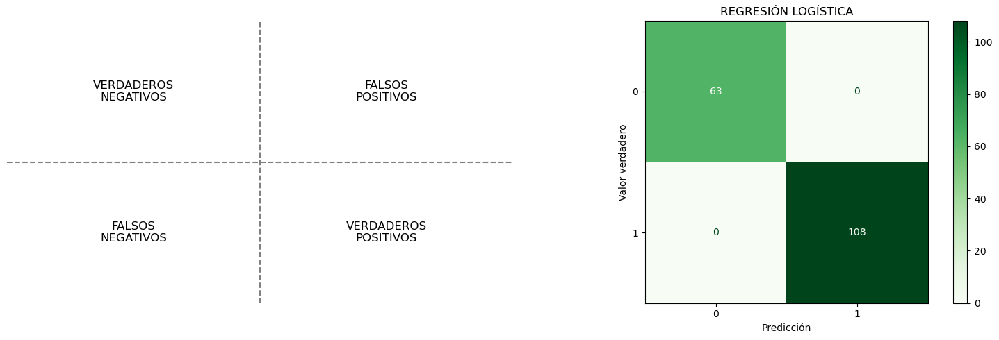

,REGRESION LOGISTICA
Accuracy,100.0%
Precision,1.0
Recall,1.0


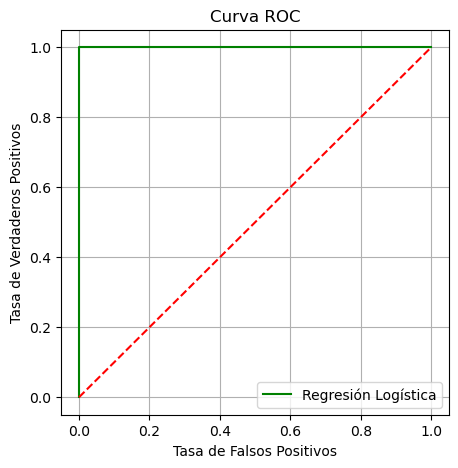

AUC Regresión Logística = 1.0

Datos escalados con Normalizer


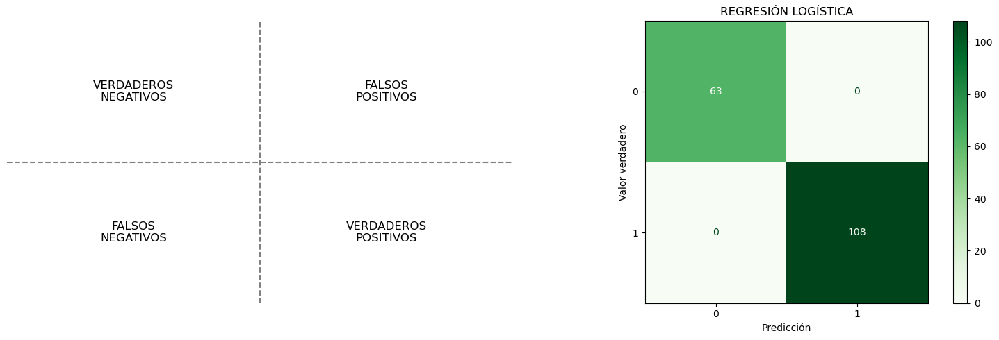

,REGRESION LOGISTICA
Accuracy,100.0%
Precision,1.0
Recall,1.0


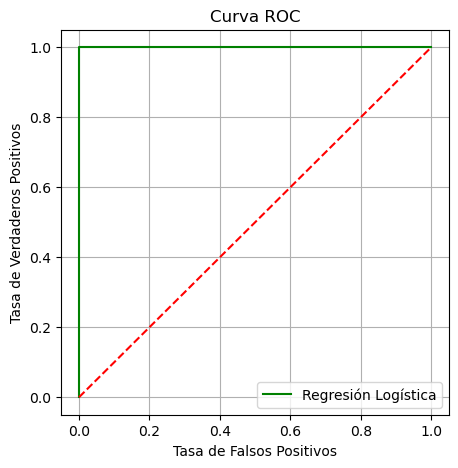

AUC Regresión Logística = 1.0


In [278]:
for i in scaled_df:
    print (f"\nDatos escalados con {i}")
    
    X_train_SS = scaled_df[i][0]
    X_test_SS = scaled_df[i][1]

    LogRegression (X_train_SS, y_train, X_test_SS, y_test)

### Regresión Logística con features seleccionadas

In [281]:
selected_columns = list(selected_features)
selected_columns.append('target')
print(selected_columns)


['mean texture', 'mean concave points', 'area error', 'concave points error', 'worst radius', 'worst texture', 'worst area', 'worst smoothness', 'target']


In [283]:
df_selected = df[selected_columns]
df_selected.head()

,mean texture,mean concave points,area error,concave points error,worst radius,worst texture,worst area,worst smoothness,target
0,10.38,0.14710,153.40,0.01587,25.38,17.33,2019.0,0.1622,0
1,17.77,0.07017,74.08,0.01340,24.99,23.41,1956.0,0.1238,0
2,21.25,0.12790,94.03,0.02058,23.57,25.53,1709.0,0.1444,0
3,20.38,0.10520,27.23,0.01867,14.91,26.50,567.7,0.2098,0
4,14.34,0.10430,94.44,0.01885,22.54,16.67,1575.0,0.1374,0


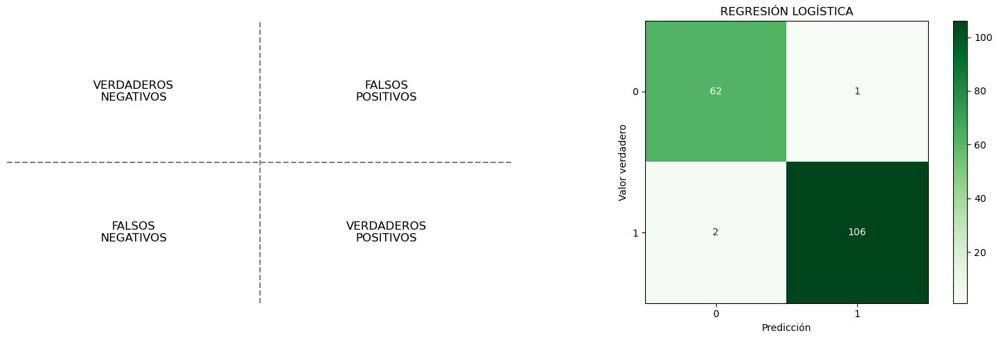

,REGRESION LOGISTICA
Accuracy,98.25%
Precision,0.9907
Recall,0.9815


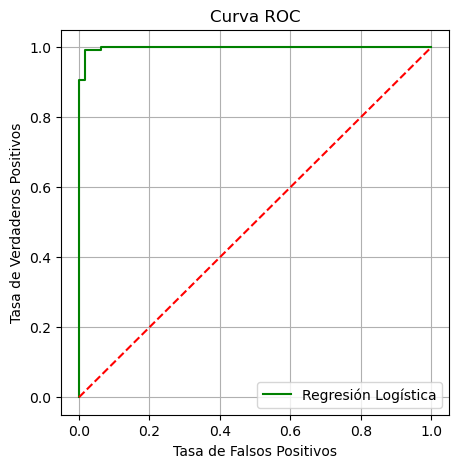

AUC Regresión Logística = 0.9980893592004703


In [285]:
X = df.drop('target', axis=1)
y = df['target']
# 70-30
X_train, X_test, y_train, y_test = train_test_split(X,  y, test_size=0.3, random_state=42)

# Escalamiento de datos
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

X_train_scaled = pd.DataFrame(X_train_scaled, columns=X.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X.columns)

LogRegression (X_train_scaled, y_train, X_test_scaled, y_test)

## 5. Interpretación de resultados

In [288]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)



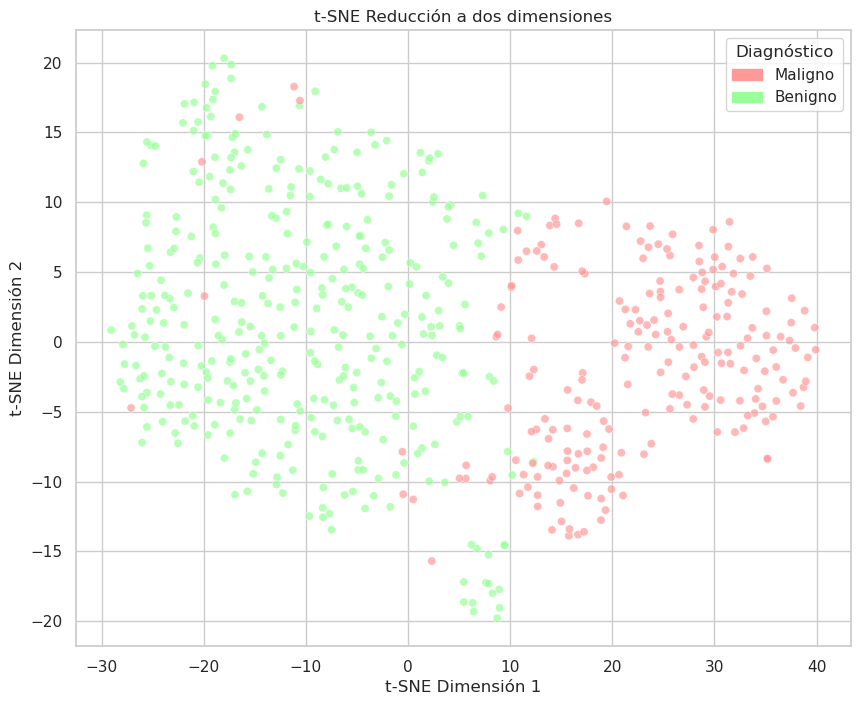

In [290]:
# Configurar y ajustar t-SNE para dos dimensiones
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X_scaled)

df_tsne = pd.DataFrame(data=X_tsne, columns=['TSNE1', 'TSNE2'])
df_tsne['target'] = y

sns.set(style="whitegrid")

plt.figure(figsize=(10, 8))
ax = sns.scatterplot(x='TSNE1', y='TSNE2', hue='target', data=df_tsne, palette=palette, alpha=0.7)
plt.title('t-SNE Reducción a dos dimensiones')
plt.xlabel('t-SNE Dimensión 1')
plt.ylabel('t-SNE Dimensión 2')
handles = [patches.Patch(color=palette[0], label='Maligno'), patches.Patch(color=palette[1], label='Benigno')]
plt.legend(handles=handles, title='Diagnóstico', loc='upper right')
plt.show()


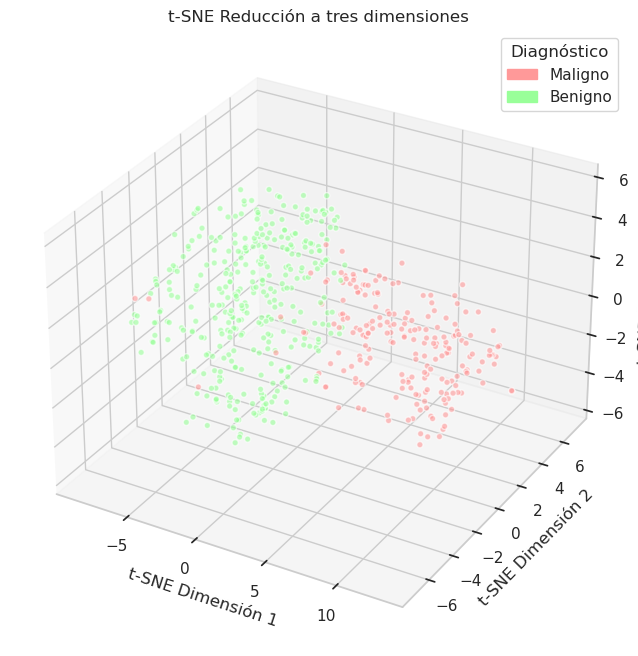

In [291]:
# Aplicar t-SNE para reducción a tres dimensiones
tsne = TSNE(n_components=3, random_state=42)
X_tsne = tsne.fit_transform(X_scaled)

df_tsne = pd.DataFrame(data=X_tsne, columns=['TSNE1', 'TSNE2', 'TSNE3'])
df_tsne['target'] = y

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')


colors = [palette[label] for label in df_tsne['target']]
 
ax.scatter(df_tsne['TSNE1'], df_tsne['TSNE2'], df_tsne['TSNE3'], c=colors, alpha=0.6, edgecolors='w')

# Etiquetas y título
ax.set_xlabel('t-SNE Dimensión 1')
ax.set_ylabel('t-SNE Dimensión 2')
ax.set_zlabel('t-SNE Dimensión 3')
ax.set_title('t-SNE Reducción a tres dimensiones')
handles = [patches.Patch(color=palette[0], label='Maligno'), patches.Patch(color=palette[1], label='Benigno')]
plt.legend(handles=handles, title='Diagnóstico', loc='best')

plt.show()


### Validación Cruzada - KFold

In [295]:
# Crear el modelo
model = SVC(kernel='linear')

# Configurar la validación cruzada estratificada
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Evaluar el modelo usando validación cruzada
scores = cross_val_score(model, X_scaled, y, cv=skf)

print(f'Scores: {scores}')
print(f'Average Score: {scores.mean()}')


Scores: [0.99122807 0.94736842 0.95614035 0.99122807 0.99115044]
Average Score: 0.9754230709517155


### Recursive Feature Elimination

In [298]:
# Escalar las características
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

feature_names = X.columns

model = LogisticRegression(max_iter=10000)  # Sí o sí el modelo converge

for i in range(1, 32):
    rfe = RFE(estimator=model, n_features_to_select=i)

    rfe.fit(X_train_scaled, y_train)

    X_train_selected = rfe.transform(X_train_scaled)
    X_test_selected = rfe.transform(X_test_scaled)

    model.fit(X_train_selected, y_train)
    y_pred = model.predict(X_test_selected)
    accuracy = accuracy_score(y_test, y_pred)

    print(f'\nNúmero de características seleccionadas: {rfe.n_features_}')
    print(f'Características seleccionadas: {feature_names[rfe.support_]}')
    print(f'Precisión del modelo: {accuracy:.2f}')



Número de características seleccionadas: 1
Características seleccionadas: Index(['worst area'], dtype='object')
Precisión del modelo: 0.95

Número de características seleccionadas: 2
Características seleccionadas: Index(['worst area', 'worst concave points'], dtype='object')
Precisión del modelo: 0.96

Número de características seleccionadas: 3
Características seleccionadas: Index(['worst radius', 'worst area', 'worst concave points'], dtype='object')
Precisión del modelo: 0.96

Número de características seleccionadas: 4
Características seleccionadas: Index(['radius error', 'worst radius', 'worst area', 'worst concave points'], dtype='object')
Precisión del modelo: 0.95

Número de características seleccionadas: 5
Características seleccionadas: Index(['radius error', 'worst radius', 'worst texture', 'worst area',
       'worst concave points'],
      dtype='object')
Precisión del modelo: 0.97

Número de características seleccionadas: 6
Características seleccionadas: Index(['mean concav